# Crop Yield Prediction

## Overview

This project focuses on analyzing and predicting **crop yields** for six key crops in India:

- **Gram**
- **Massor**
- **Mustard**
- **Potato**
- **Rabi Rice**
- **Wheat**

Using **weather** and **reservoir data**, this study spans **daily observations from 2000 to 2022**. The data is **aggregated by state and year** to examine the influence of environmental factors on agricultural productivity.

---

## Project Goals

The main objectives of this project are:

- To investigate how **weather variables** (e.g., temperature, rainfall) and **reservoir metrics** (e.g., Full Reservoir Level, water storage) affect crop yields.
- To develop **predictive models** for forecasting crop yields, enabling better **resource allocation**.

---


Data Loading and Inspection (Cells 1–3)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdate
import seaborn as sns
import plotly.express as px
from sklearn.linear_model import RidgeCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load reservoir–yield datasets for each crop

df_gram = pd.read_csv("/content/drive/MyDrive/Datas/merged_gram_reservoir.csv") #107753rows
df_massor = pd.read_csv("/content/drive/MyDrive/Datas/merged_massor_reservoir.csv") #58073rows
df_mustard = pd.read_csv("/content/drive/MyDrive/Datas/merged_mustard_reservoir.csv") #96429rows
df_potato = pd.read_csv("/content/drive/MyDrive/Datas/merged_potato_reservoir.csv") #47848rows
df_rabi = pd.read_csv("/content/drive/MyDrive/Datas/merged_rabi_rice_reservoir.csv") #27759rows
df_wheat = pd.read_csv("/content/drive/MyDrive/Datas/merged_wheat_reservoir.csv") #100812

In [3]:
#  Inspect data types and missing values for each dataset

print("Data Types for Gram ")
print(df_gram.dtypes)
print("\nMissing Values: ")
print(df_gram.isnull().sum())
print("\nPercentage of Missing Values: ")
print((df_gram.isnull().sum() / len(df_gram)) * 100)


print("Data Types for Massor ")
print(df_massor.dtypes)
print("\nMissing Values: ")
print(df_massor.isnull().sum())
print("\nPercentage of Missing Values: ")
print((df_massor.isnull().sum() / len(df_massor)) * 100)


print("Data Types for Mustard ")
print(df_mustard.dtypes)
print("\nMissing Values: ")
print(df_mustard.isnull().sum())
print("\nPercentage of Missing Values: ")
print((df_mustard.isnull().sum() / len(df_mustard)) * 100)


print("Data Types for Potato ")
print(df_potato.dtypes)
print("\nMissing Values: ")
print(df_potato.isnull().sum())
print("\nPercentage of Missing Values: ")
print((df_potato.isnull().sum() / len(df_potato)) * 100)


print("Data Types for Rabi ")
print(df_rabi.dtypes)
print("\nMissing Values: ")
print(df_rabi.isnull().sum())
print("\nPercentage of Missing Values: ")
print((df_rabi.isnull().sum() / len(df_rabi)) * 100)


print("Data Types for Wheat ")
print(df_wheat.dtypes)
print("\nMissing Values: ")
print(df_wheat.isnull().sum())
print("\nPercentage of Missing Values: ")
print((df_wheat.isnull().sum() / len(df_wheat)) * 100)



Data Types for Gram 
state_name                    object
crop_name                     object
apy_item_interval_start        int64
temperature_recorded_date     object
state_temperature_max_val    float64
state_temperature_min_val    float64
state_rainfall_val           float64
yield                        float64
FRL                          float64
Live Cap FRL                 float64
Level                        float64
Current Live Storage         float64
dtype: object

Missing Values: 
state_name                     0
crop_name                      0
apy_item_interval_start        0
temperature_recorded_date      0
state_temperature_max_val      0
state_temperature_min_val      0
state_rainfall_val             0
yield                          0
FRL                            0
Live Cap FRL                   0
Level                        400
Current Live Storage         397
dtype: int64

Percentage of Missing Values: 
state_name                   0.000000
crop_name               

#**data dictionary**

| Column Name                 | Meaning                                                           |
| --------------------------- | ----------------------------------------------------------------- |
| `state_name`                | Indian state where data is recorded                               |
| `crop_name`                 | Type of crop (e.g., gram, wheat, etc.)                            |
| `apy_item_interval_start`   | Year of sowing season (e.g., 2000)                                |
| `temperature_recorded_date` | Date of weather data (daily)                                      |
| `state_temperature_max_val` | Max temp recorded on the day                                      |
| `state_temperature_min_val` | Min temp recorded on the day                                      |
| `state_rainfall_val`        | Rainfall in mm on the day                                         |
| `yield`                     | Yield in tonnes or quintals per hectare (units not sure) |
| `FRL`                       | Full Reservoir Level (Water storage limit)                        |
| `Live Cap FRL`              | % of storage relative to FRL                                      |
| `Level`                     | Water level in reservoir                                          |
| `Current Live Storage`      | Actual water stored on the date                                   |


Exploratory Data Analysis (Cells 4–6)

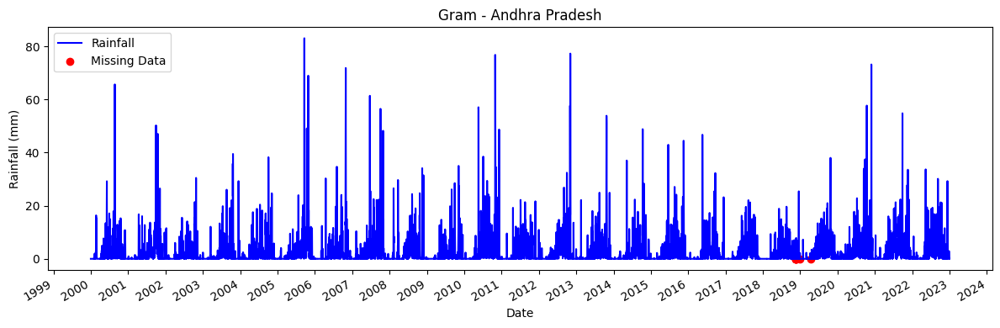

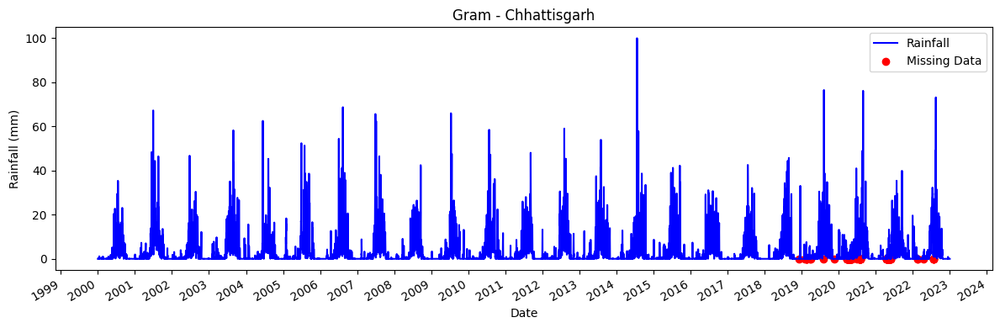

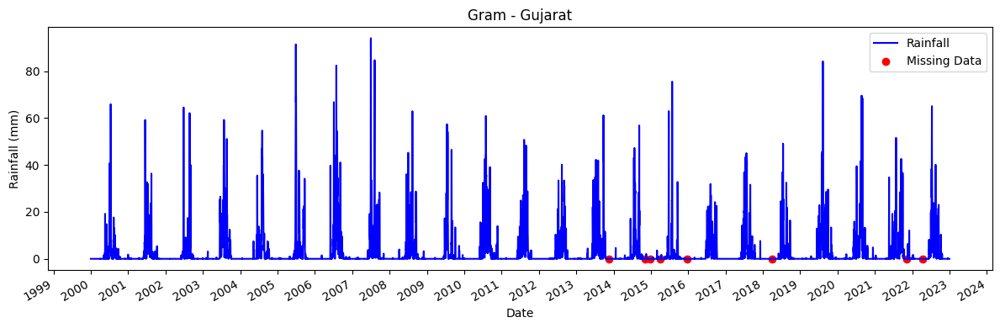

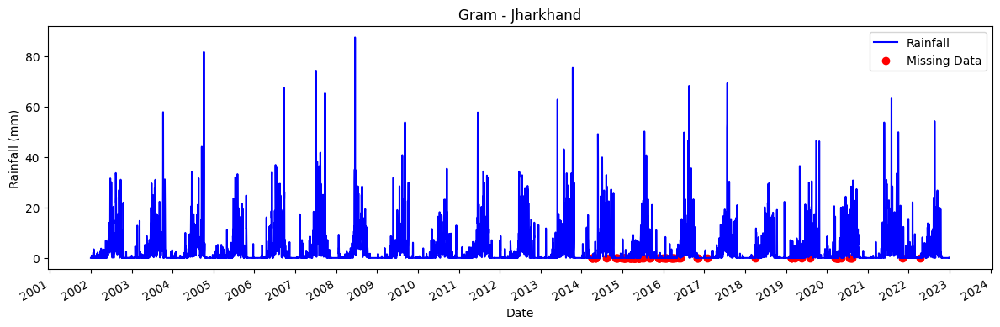

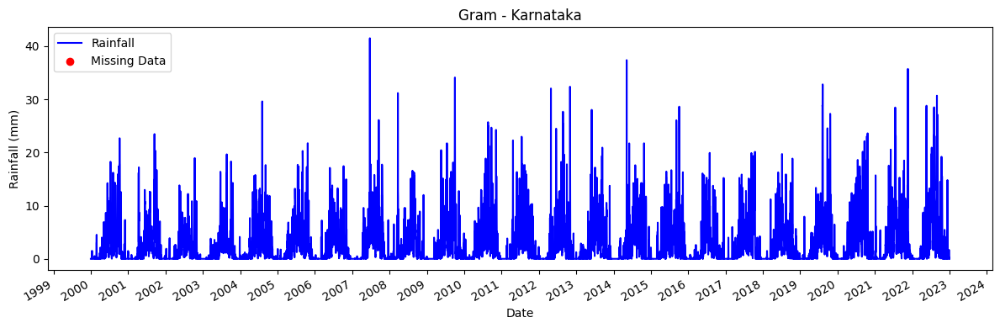

...

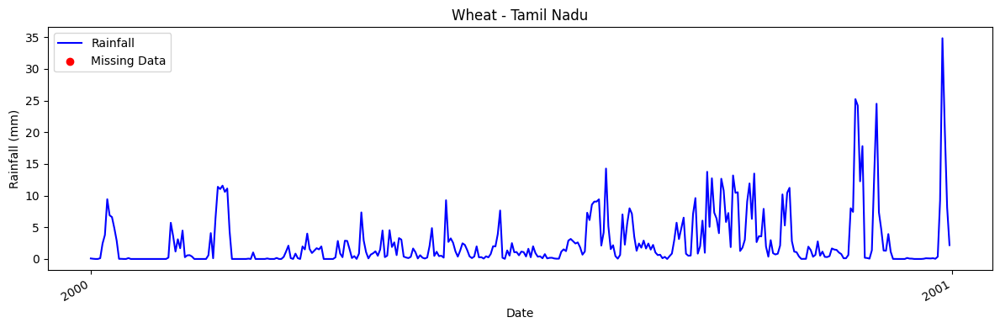

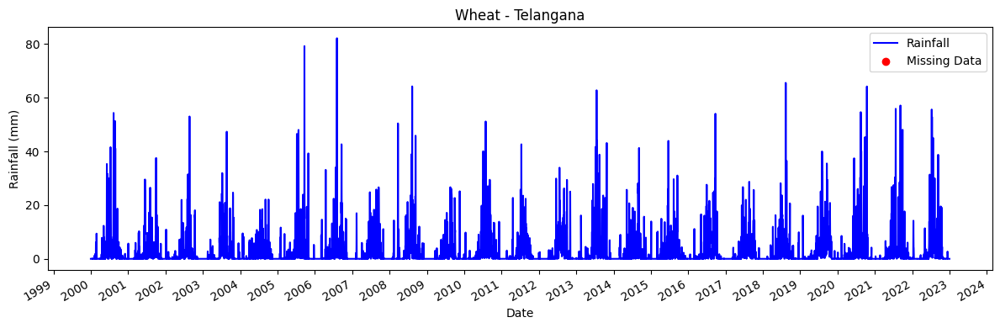

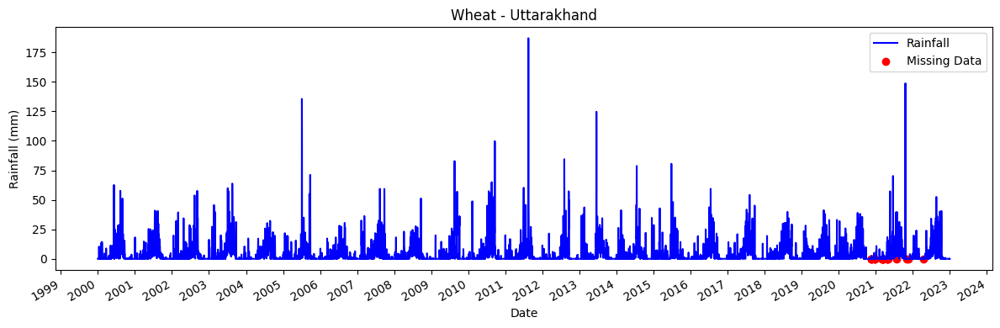

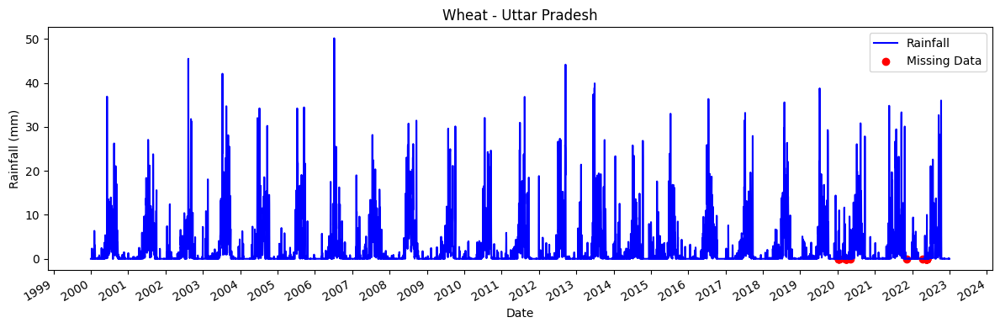

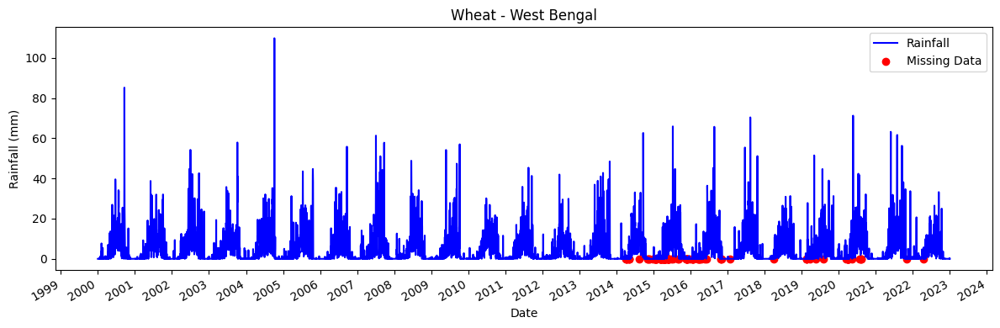

In [4]:
# Plot rainfall with missing-data overview


def plot_rainfall_and_missing(df, crop_name):
    df['Date'] = pd.to_datetime(df['temperature_recorded_date'])
    states = df['state_name'].unique()

    for state in states:
        state_df = df[df['state_name'] == state]
        missing = state_df['Level'].isna() | state_df['Current Live Storage'].isna()

        plt.figure(figsize=(12, 4))
        plt.plot(state_df['Date'], state_df['state_rainfall_val'], color='blue', label='Rainfall')
        plt.scatter(state_df.loc[missing, 'Date'], [0]*missing.sum(), color='red', label='Missing Data')
        plt.title(f'{crop_name} - {state}')
        plt.xlabel('Date')
        plt.ylabel('Rainfall (mm)')
        plt.legend()

        plt.gca().xaxis.set_major_locator(mdate.YearLocator())
        plt.gca().xaxis.set_major_formatter(mdate.DateFormatter('%Y'))
        plt.gcf().autofmt_xdate()

        plt.tight_layout()
        plt.show()

plot_rainfall_and_missing(df_gram, 'Gram')
plot_rainfall_and_missing(df_massor, 'Massor')
plot_rainfall_and_missing(df_mustard, 'Mustard')
plot_rainfall_and_missing(df_potato, 'Potato')
plot_rainfall_and_missing(df_rabi, 'Rabi')
plot_rainfall_and_missing(df_wheat, 'Wheat')

### Data Summary

#### 1. General Notes
- Only two columns contain missing values:
  - `level`
  - `current live storage`
- Missing values are inconsistent across years and states, likely due to manual entry errors or mismanagement.

#### 2. Time Frame
- Data typically spans from **2000 to 2022**.

#### 3. States Included
- Andhra Pradesh  
- Chhattisgarh  
- Gujarat  
- Jharkhand  
- Karnataka  
- Madhya Pradesh  
- Maharashtra  
- Odisha  
- Rajasthan  
- Tamil Nadu  
- Telangana  
- Uttar Pradesh  
- Uttarakhand  
- West Bengal



### Crop-Specific Observations

---

#### a. Common Note
- **Jharkhand**: Data starts from **2002** for each crop.

---

#### b. Grams
- **Madhya Pradesh**: No data for **2009**
- **Odisha**: Missing for **2005–2018**, and **2020 onwards**
- **Tamil Nadu**: Missing for **2001**, **2006–2009**, **2011**, and **2013**

---

#### c. Massor
- Only includes:
  - Chhattisgarh
  - Jharkhand
  - Madhya Pradesh
  - Odisha
  - Rajasthan
  - Telangana
  - Uttar Pradesh
  - Uttarakhand
  - West Bengal

**Missing Values:**
- **Jharkhand**: No data for **2000, 2001, 2008, 2016**
- **Madhya Pradesh**: No data for **2000–2002, 2009**
- **Odisha**: No data for **2000, 2005–2018, and 2020 onwards**
- **Telangana**: No data for **2000–2012**, and **2016 onwards**
- **Uttar Pradesh**: No data for **2004 and 2005**

---

#### d. Mustard
- **Andhra Pradesh**: No data for **2007**
- **Karnataka**: No data for **2006, 2007, 2012 onwards**
- **Madhya Pradesh**: No data for **2009**
- **Maharashtra**: No data for **2013–2015**, and **2020 onwards**
- **Odisha**: No data from **2004 onwards**
- **Tamil Nadu**: No data for **2001, 2006–2010, 2012**
- **Telangana**: No data for **2007, 2012, 2016 onwards**

---

#### e. Potato
Only includes the following states:
- Andhra Pradesh
- Chhattisgarh
- Jharkhand
- Karnataka
- Tamil Nadu
- Telangana
- Uttar Pradesh
- Uttarakhand
- West Bengal

**State-wise details:**
- **Andhra Pradesh**: Starts from **2012**
- **Chhattisgarh**: Starts from **2006**; missing **2009–2010**
- **Jharkhand**: Data available from **2002–2020**, missing **2017–2019**
- **Karnataka**: Data from **2005–2022**, missing **2006**
- **Tamil Nadu**: Data from **2013–2022**
- **Telangana**: Data from **2014–2022**
- **Uttar Pradesh**: Data from **2004–2022**
- **Uttarakhand**: No data for **2003–2005**
- **West Bengal**: Data from **2009–2022**

---

#### f. Rabi Rice
Only includes:
- Andhra Pradesh
- Jharkhand
- Karnataka
- Telangana
- Uttarakhand

**State-wise details:**
- **Jharkhand**: Only has data for **2022**
- **Uttarakhand**: Data for **2000–2010**, excluding **2003–2005** and **2007–2008**

---

#### g. Wheat
- **Andhra Pradesh**: Missing **2007 and 2012**
- **Madhya Pradesh**: Missing **2009**
- **Odisha**: Only data for **2000–2003**
- **Tamil Nadu**: Only has data for **2000**

---


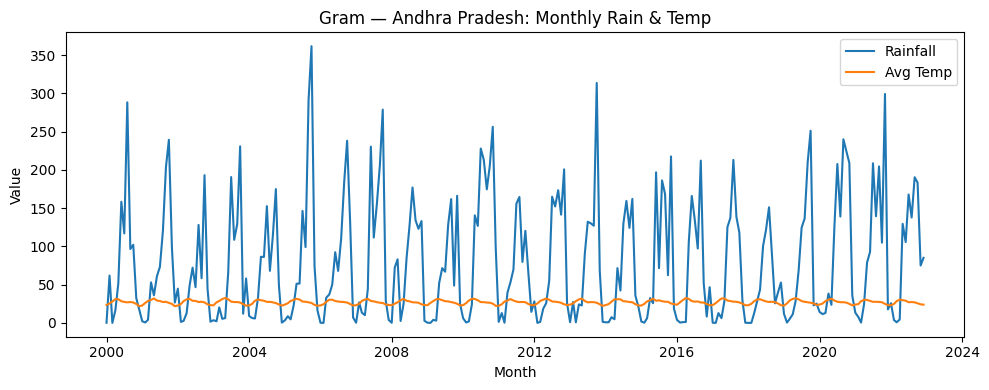

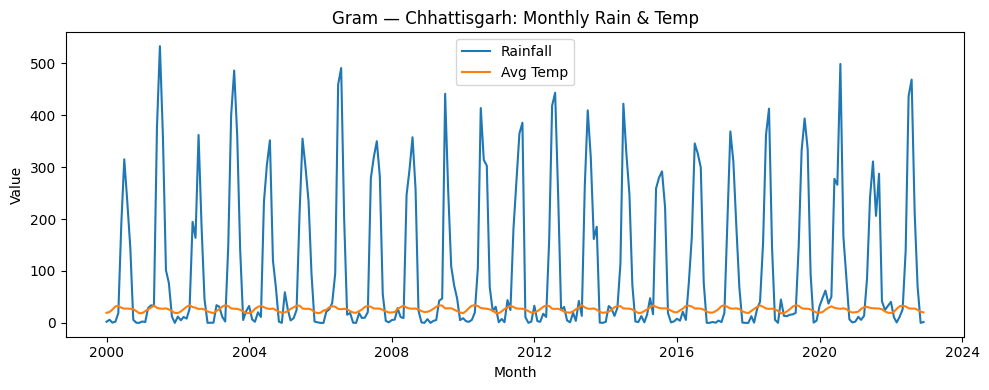

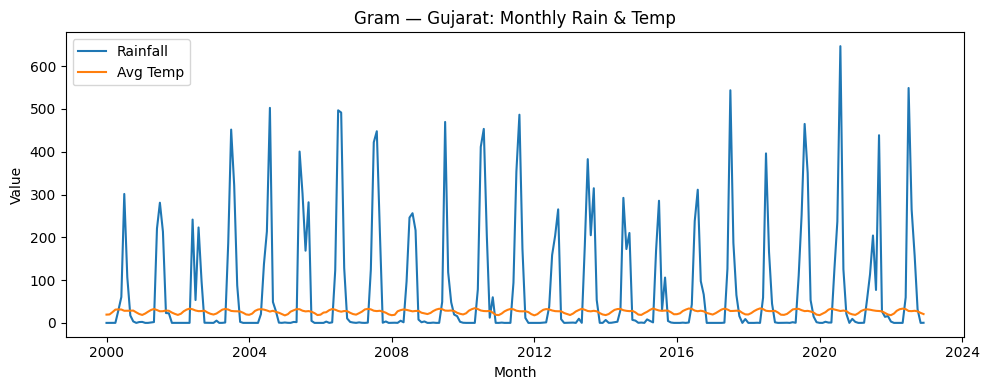

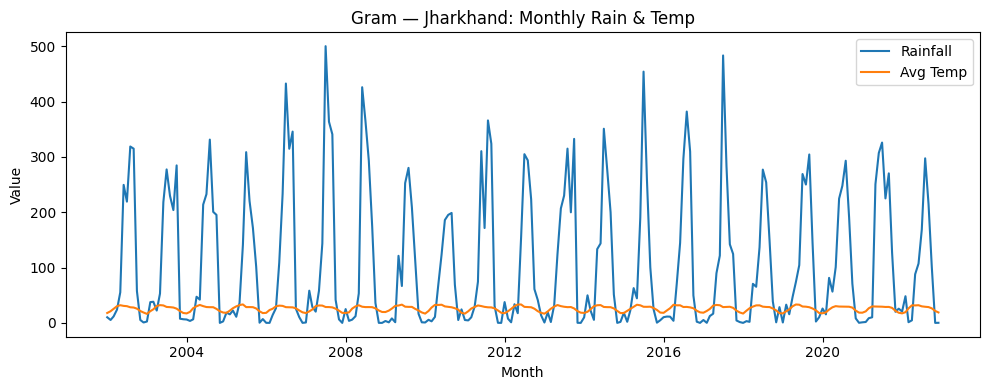

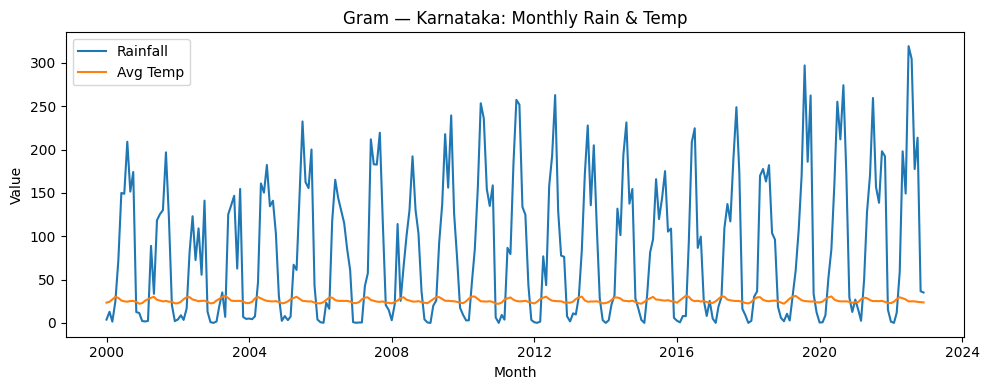

...

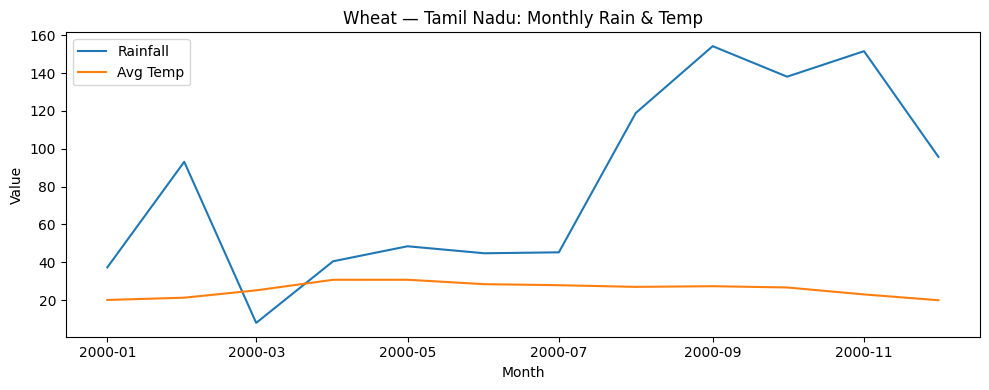

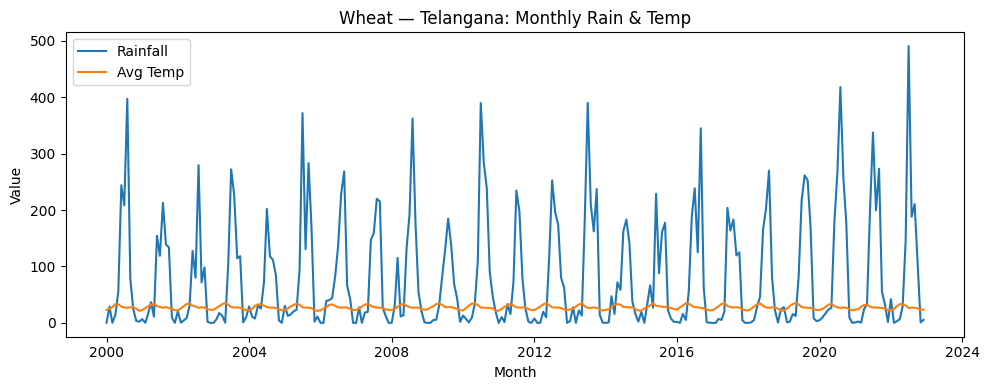

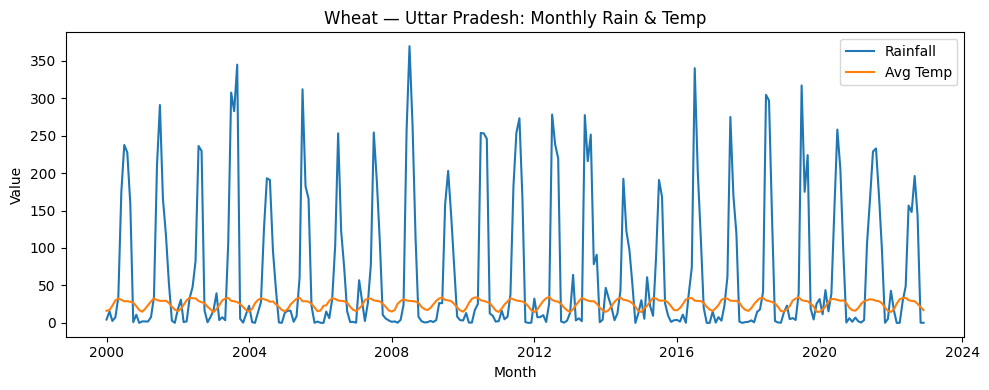

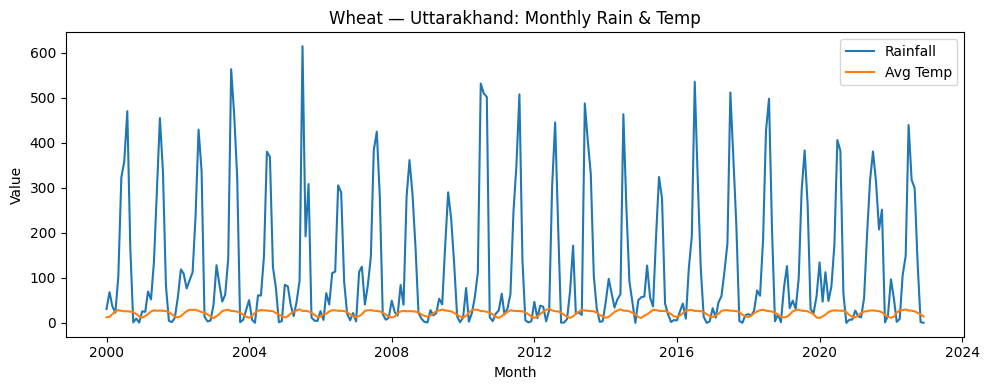

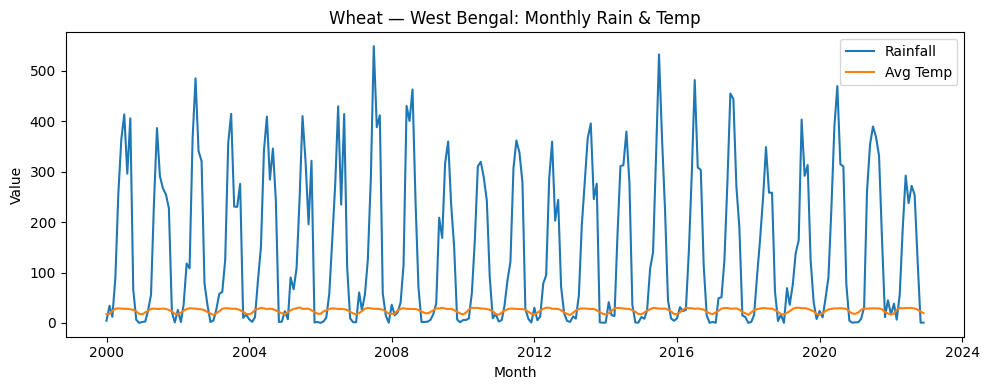

In [5]:
def plot_monthly_rain_temp(df, crop_name):
    df['Date'] = pd.to_datetime(df['temperature_recorded_date'])
    df['Month'] = df['Date'].dt.to_period('M').dt.to_timestamp()
    df['avg_temp'] = (df['state_temperature_max_val'] + df['state_temperature_min_val']) / 2

    monthly = (
        df
        .groupby(['state_name','Month'])
        .agg(rainfall=('state_rainfall_val','sum'),
             avg_temp=('avg_temp','mean'))
        .reset_index()
    )

    for state, grp in monthly.groupby('state_name'):
        plt.figure(figsize=(10,4))
        plt.plot(grp['Month'], grp['rainfall'], label='Rainfall')
        plt.plot(grp['Month'], grp['avg_temp'], label='Avg Temp')
        plt.title(f'{crop_name} — {state}: Monthly Rain & Temp')
        plt.xlabel('Month')
        plt.ylabel('Value')
        plt.legend()
        plt.tight_layout()
        plt.show()

plot_monthly_rain_temp(df_gram,     'Gram')
plot_monthly_rain_temp(df_massor,   'Massor')
plot_monthly_rain_temp(df_mustard,  'Mustard')
plot_monthly_rain_temp(df_potato,   'Potato')
plot_monthly_rain_temp(df_rabi,     'Rabi')
plot_monthly_rain_temp(df_wheat,    'Wheat')


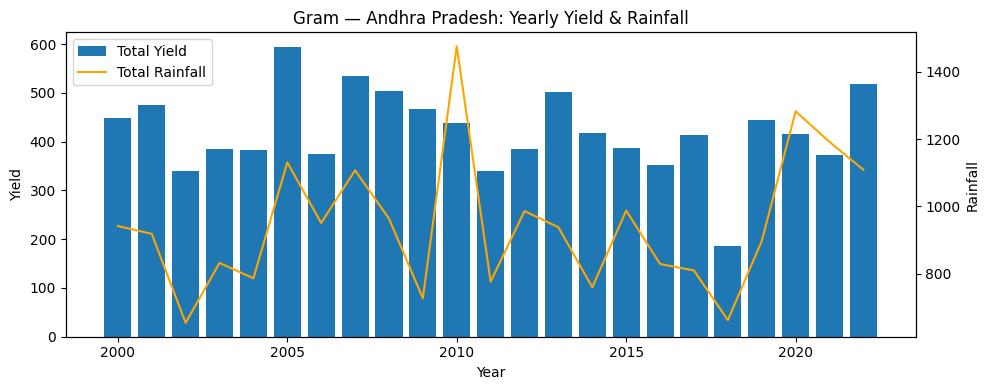

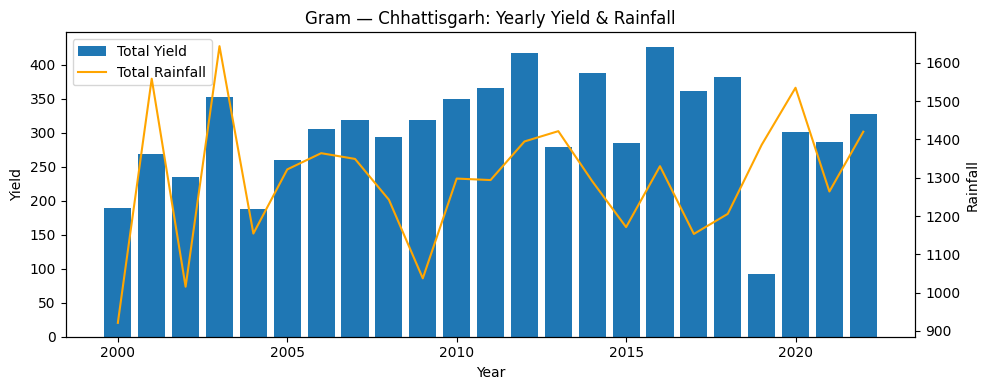

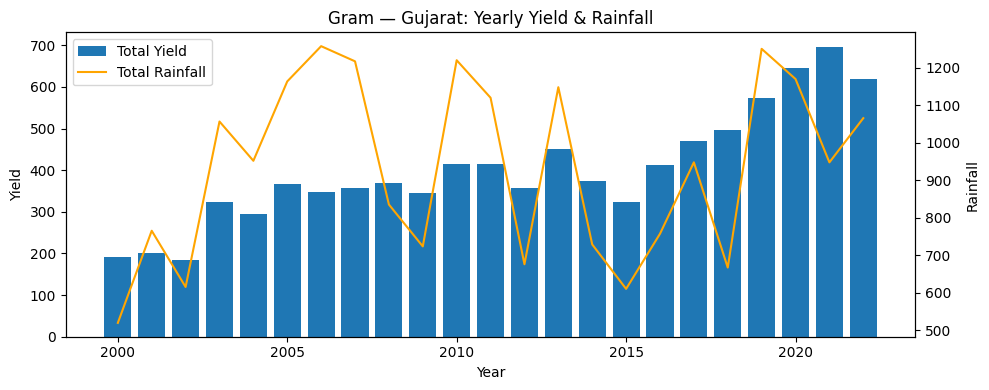

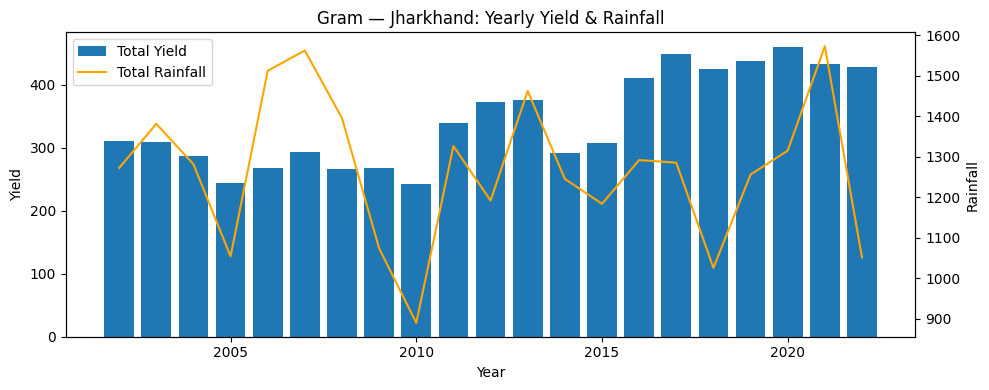

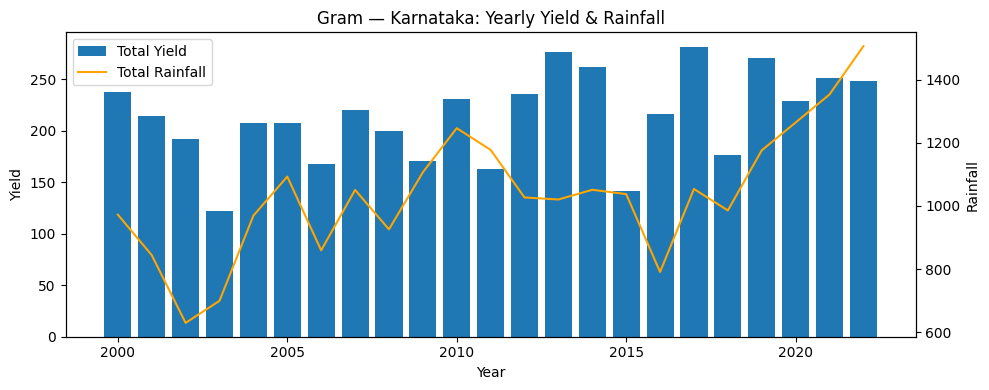

...

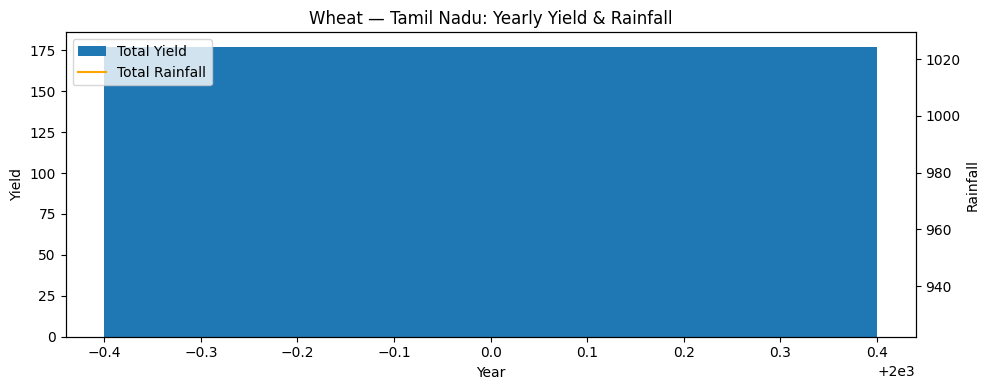

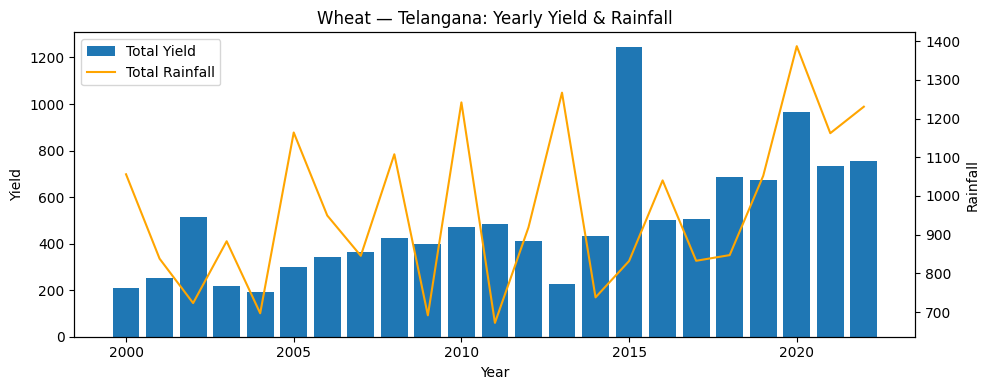

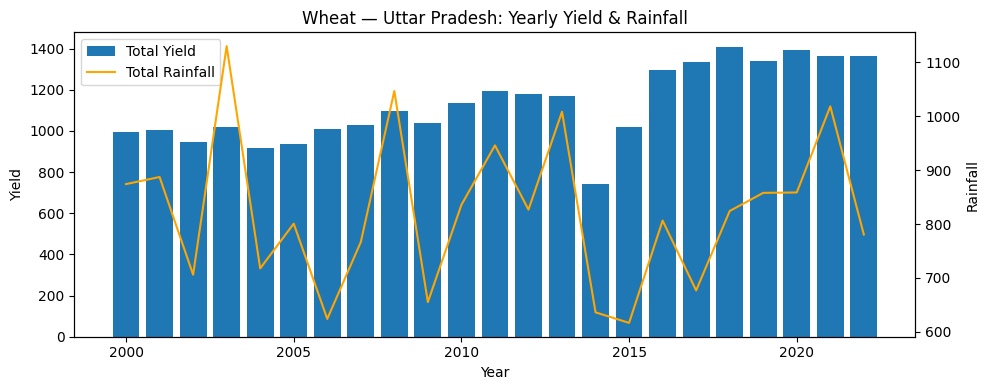

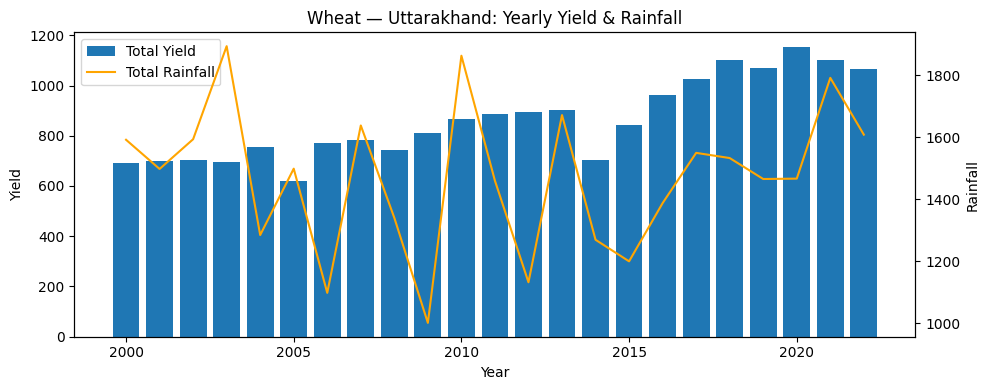

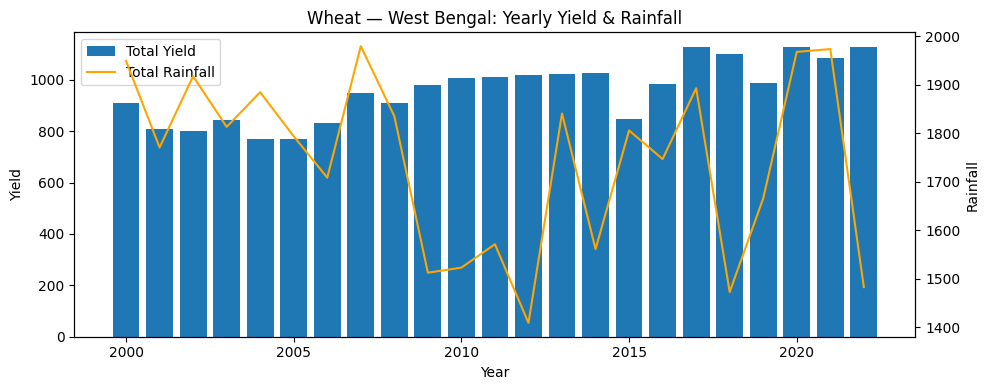

In [6]:
def plot_yearly_yield_rainfall(df, crop_name):
    df['Date'] = pd.to_datetime(df['temperature_recorded_date'])
    df['Year'] = df['Date'].dt.year

    yearly = (
        df
        .groupby(['state_name','Year'])
        .agg(total_rainfall=('state_rainfall_val','sum'),
             total_yield=('yield','sum'))
        .reset_index()
    )

    for state, grp in yearly.groupby('state_name'):
        fig, ax = plt.subplots(figsize=(10,4))
        ax.bar(grp['Year'], grp['total_yield'], label='Total Yield')
        ax2 = ax.twinx()
        ax2.plot(grp['Year'], grp['total_rainfall'], color='orange', label='Total Rainfall')
        ax.set_title(f'{crop_name} — {state}: Yearly Yield & Rainfall')
        ax.set_xlabel('Year')
        ax.set_ylabel('Yield')
        ax2.set_ylabel('Rainfall')
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines+lines2, labels+labels2, loc='upper left')
        plt.tight_layout()
        plt.show()

plot_yearly_yield_rainfall(df_gram, 'Gram')
plot_yearly_yield_rainfall(df_massor, 'Massor')
plot_yearly_yield_rainfall(df_mustard, 'Mustard')
plot_yearly_yield_rainfall(df_potato, 'Potato')
plot_yearly_yield_rainfall(df_rabi, 'Rabi')
plot_yearly_yield_rainfall(df_wheat, 'Wheat')


In [7]:
#Shortlisting Crop–State Pairs with Complete 2010–2022 Data

shortlist = {
    'df_gram': [
      'Andhra Pradesh','Chhattisgarh','Gujarat','Jharkhand','Karnataka',
      'Madhya Pradesh','Maharashtra','Rajasthan','Telangana',
      'Uttar Pradesh','Uttarakhand','West Bengal'
    ],
    'df_massor': [
      'Chhattisgarh','Madhya Pradesh','Rajasthan',
      'Uttar Pradesh','Uttarakhand','West Bengal'
    ],
    'df_mustard': [
      'Andhra Pradesh','Chhattisgarh','Gujarat','Jharkhand',
      'Madhya Pradesh','Rajasthan','Uttar Pradesh',
      'Uttarakhand','West Bengal'
    ],
    'df_potato': [
      'Karnataka','Uttar Pradesh','Uttarakhand','West Bengal'
    ],
    'df_rabi': [
      'Andhra Pradesh','Karnataka','Telangana'
    ],
    'df_wheat': [
      'Gujarat','Jharkhand','Karnataka','Madhya Pradesh',
      'Maharashtra','Rajasthan','Telangana',
      'Uttar Pradesh','Uttarakhand','West Bengal'
    ]
}

# Filter each DataFrame for years 2010–2022 and the shortlisted states
for df_name, states in shortlist.items():
    df = globals()[df_name]
    # ensure apy_item_interval_start is int
    df = df[df['apy_item_interval_start'].between(2010, 2022)]
    df = df[df['state_name'].isin(states)]
    globals()[df_name + '_final'] = df.copy()
    print(f"{df_name}_final → {df['state_name'].nunique()} states, {df['apy_item_interval_start'].nunique()} years")

df_gram_final → 12 states, 13 years
df_massor_final → 6 states, 13 years
df_mustard_final → 9 states, 13 years
df_potato_final → 4 states, 13 years
df_rabi_final → 3 states, 13 years
df_wheat_final → 10 states, 13 years


Visualizations (Cells 18–21)

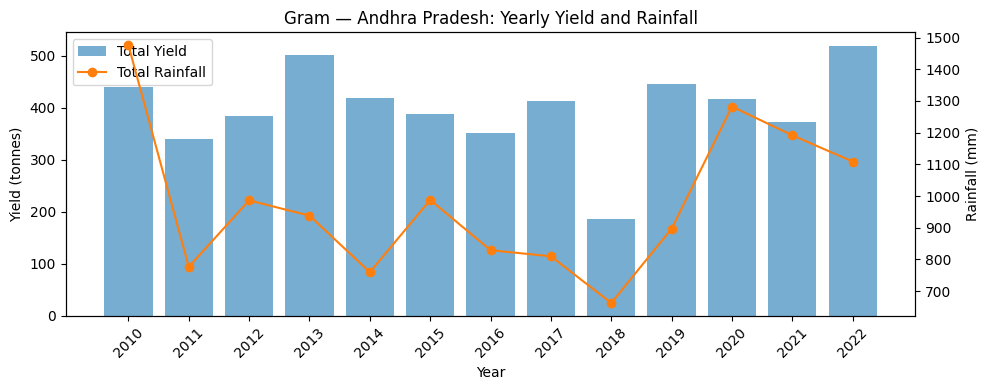

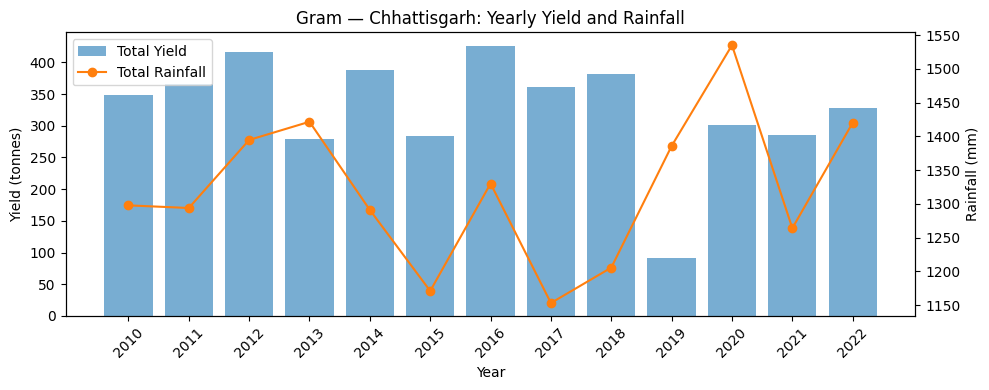

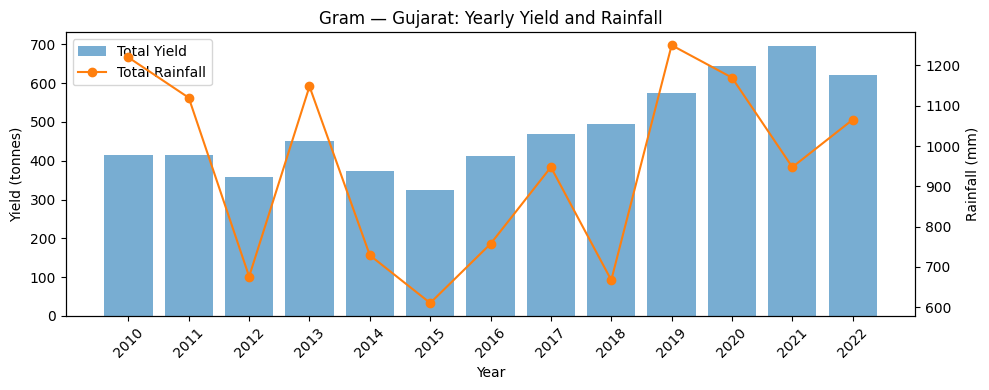

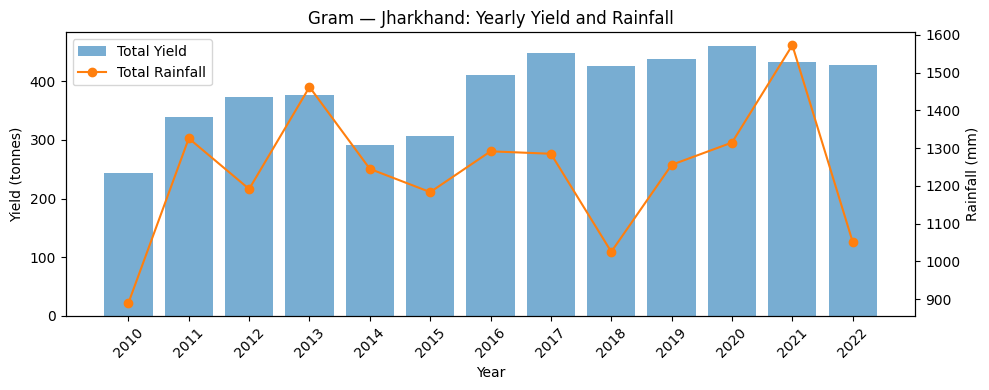

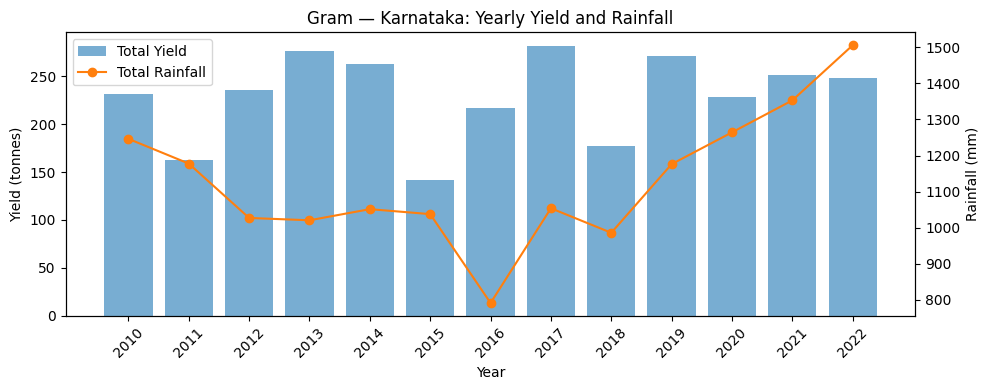

...

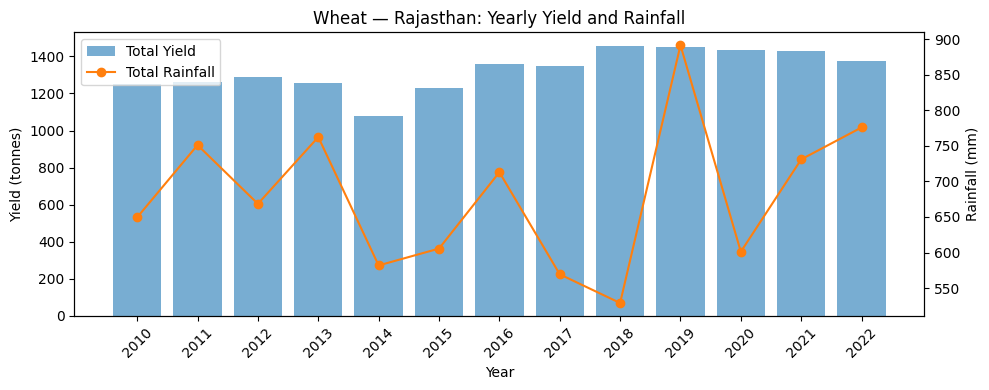

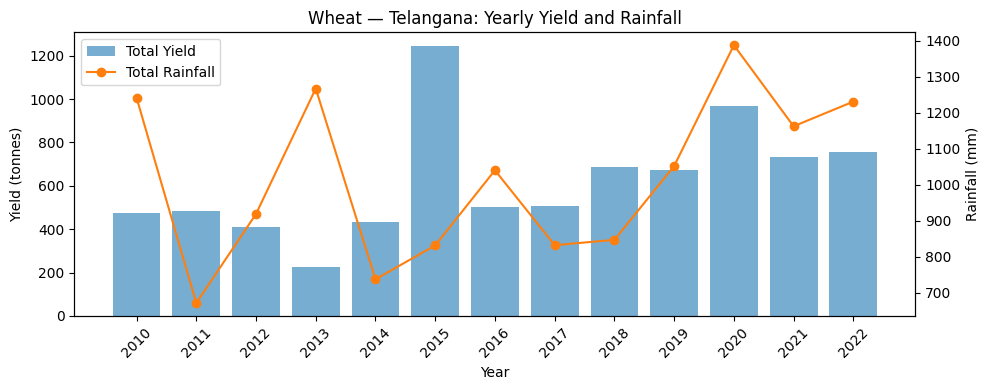

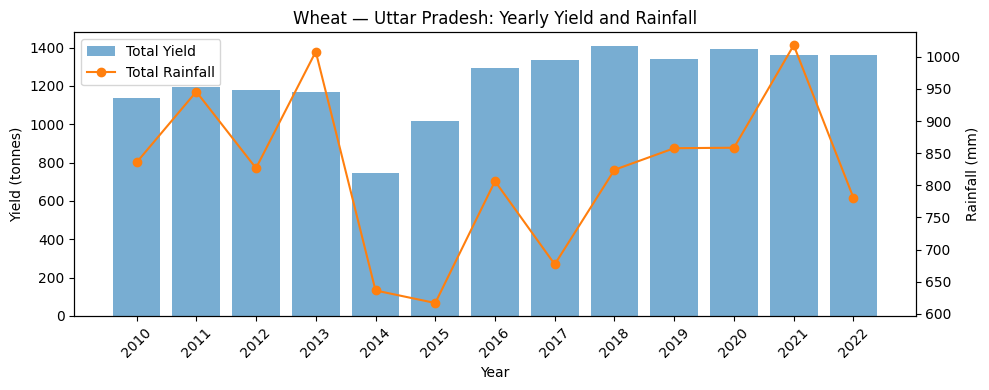

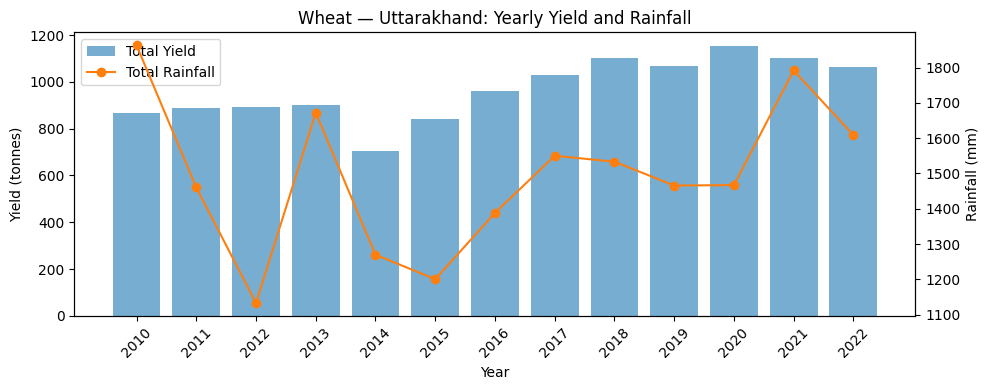

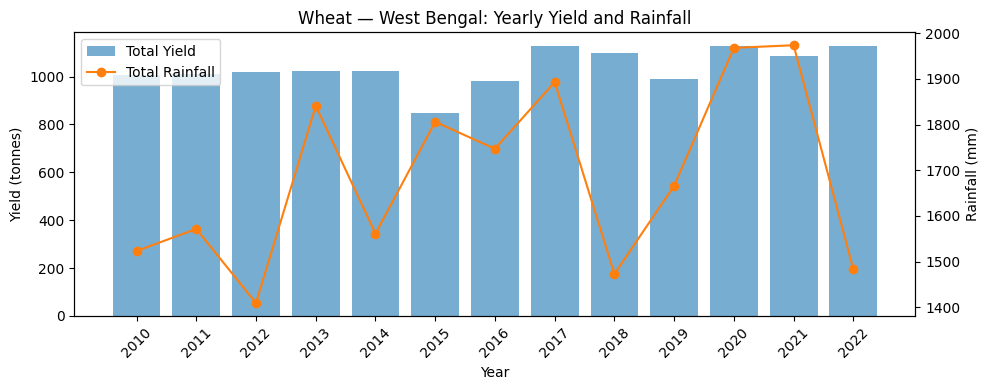

In [8]:
def plot_yearly_yield_rainfall(df, crop_name):
    """
    Plot yearly yield and rainfall for each state in a DataFrame.

    Parameters:
    df (pd.DataFrame): DataFrame containing crop data with columns 'temperature_recorded_date',
                       'state_name', 'yield', 'state_rainfall_val'.
    crop_name (str): Name of the crop for the plot title.
    """
    # Create a copy to avoid modifying the original DataFrame
    df = df.copy()

    # Convert date column to datetime and extract year
    df['Date'] = pd.to_datetime(df['temperature_recorded_date'])
    df['Year'] = df['Date'].dt.year

    # Aggregate data by state and year
    yearly = (
        df.groupby(['state_name', 'Year'])
        .agg(
            total_rainfall=('state_rainfall_val', 'sum'),
            total_yield=('yield', 'sum')
        )
        .reset_index()
    )

    # Iterate over each state
    for state, grp in yearly.groupby('state_name'):
        # Create a single plot for yield and rainfall
        fig, ax1 = plt.subplots(figsize=(10, 4))

        # Plot: Yield (bar) and Rainfall (line)
        ax1.bar(grp['Year'], grp['total_yield'], label='Total Yield', alpha=0.6, color='tab:blue')
        ax1.set_ylabel('Yield (tonnes)')
        ax1_twin = ax1.twinx()
        ax1_twin.plot(grp['Year'], grp['total_rainfall'], color='tab:orange', marker='o', label='Total Rainfall')
        ax1_twin.set_ylabel('Rainfall (mm)')
        ax1.set_title(f'{crop_name} — {state}: Yearly Yield and Rainfall')
        ax1.set_xlabel('Year')

        # Combine legends
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines1b, labels1b = ax1_twin.get_legend_handles_labels()
        ax1.legend(lines1 + lines1b, labels1 + labels1b, loc='upper left')

        # Set x-axis to show all years from 2010 to 2022
        ax1.set_xticks(range(2010, 2023))
        ax1.set_xticklabels(range(2010, 2023), rotation=45)

        # Adjust layout to preven t overlap
        plt.tight_layout()
        plt.show()

# Usage
plot_yearly_yield_rainfall(df_gram_final, 'Gram')
plot_yearly_yield_rainfall(df_massor_final, 'Massor')
plot_yearly_yield_rainfall(df_mustard_final, 'Mustard')
plot_yearly_yield_rainfall(df_potato_final, 'Potato')
plot_yearly_yield_rainfall(df_rabi_final, 'Rabi')
plot_yearly_yield_rainfall(df_wheat_final, 'Wheat')

In [9]:
def annual_state_dashboard(df, crop_name):
    df = df.copy()
    df['Date'] = pd.to_datetime(df['temperature_recorded_date'])
    df['Year'] = df['Date'].dt.year

    agg = (
        df.groupby(['state_name','Year'])
        .agg(
            Yield      = ('yield','sum'),
            Rainfall   = ('state_rainfall_val','sum'),
            Mean_Level = ('Level','mean'),
            LiveCapFRL = ('Live Cap FRL','mean')
        )
        .reset_index()
    )

    fig = px.line(
        agg,
        x='Year', y=['Yield','Rainfall','Mean_Level','LiveCapFRL'],
        facet_col='state_name', facet_col_wrap=4,
        title=f"{crop_name}: Annual Yield, Rainfall & Water Metrics by State",
        labels={'value':'Amount','variable':'Metric'}
    )
    fig.update_layout(height=900)
    fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
    fig.show()

# Usage
annual_state_dashboard(df_gram_final, 'Gram')
annual_state_dashboard(df_massor_final, 'Massor')
annual_state_dashboard(df_mustard_final, 'Mustard')
annual_state_dashboard(df_potato_final, 'Potato')
annual_state_dashboard(df_rabi_final, 'Rabi')
annual_state_dashboard(df_wheat_final, 'Wheat')

In [10]:
def monthly_trends_by_year_multi(df, crop_name):
    """
    Interactive faceted line plot:
      • x-axis = Month (Jan–Dec)
      • one line per Year
      • facets for Yield, Rainfall, Level & Storage
      • separate plot per State
    """
    df = df.copy()
    df['Date']  = pd.to_datetime(df['temperature_recorded_date'])
    df['Year']  = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month

    # Compute monthly aggregates per State
    agg = (
        df.groupby(['state_name', 'Year', 'Month'])
          .agg(
              Yield    = ('yield',                'sum'),
              Rainfall = ('state_rainfall_val',   'sum'),
              Level    = ('Level',                'mean'),
              Storage  = ('Current Live Storage', 'mean')
          )
          .reset_index()
    )

    # Melt to long form for faceting
    long = agg.melt(
        id_vars=['state_name', 'Year', 'Month'],
        value_vars=['Yield','Rainfall','Level','Storage'],
        var_name='Metric',
        value_name='Value'
    )

    # Month name for x-axis
    month_names = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    long['MonthName'] = long['Month'].apply(lambda m: month_names[m-1])
    long['MonthName'] = pd.Categorical(long['MonthName'], categories=month_names, ordered=True)

    # Plot per state
    for state, state_data in long.groupby('state_name'):
        fig = px.line(
            state_data,
            x='MonthName',
            y='Value',
            color='Year',
            facet_row='Metric',
            facet_row_spacing=0.03,
            markers=True,
            title=f"{crop_name} — {state}: Monthly Trends by Year (Yield, Rainfall, Level, Storage)",
            labels={'Value':'Amount','Metric':'','MonthName':'Month'}
        )

        # Clean-up facet titles & layout
        fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
        fig.update_yaxes(matches=None)   # Each facet uses its own Y-range
        fig.update_layout(height=1400, legend={'orientation':'h','y':-0.02})
        fig.show()

#usage:
monthly_trends_by_year_multi(df_gram_final,   'Gram')
monthly_trends_by_year_multi(df_massor_final, 'Massor')
monthly_trends_by_year_multi(df_mustard_final,'Mustard')
monthly_trends_by_year_multi(df_potato_final, 'Potato')
monthly_trends_by_year_multi(df_rabi_final,   'Rabi')
monthly_trends_by_year_multi(df_wheat_final,  'Wheat')